In [60]:
import requests
from bs4 import BeautifulSoup
import re


html_doc = """
<html>
 <head><title>엔코아입니다.</title></head>
 <body>
   <p class="story1" id="myp">엔코아p태그</p>
   <a href="http://www.daum.net">다음으로가기</a>
   <p>
     <a  class="snow" id="link1" href="http://www.example.com/python">python</a>
     <a  class="snow" id="link2" href="http://www.example.com/java">java</a>
     <a  class="snow" id="link3" href="http://www.example.com/javascript">javascript</a>
     <a  class="snow" id="link4" href="http://www.example.com/hadoop">hadoop</a>
   </p>
   <p class="story2"><b>눈이옵니다.</b></p>
   <p class="story2"><b>눈이 많이 옵니다.</b></p>
 </body>
</html>
"""
soup = BeautifulSoup(html_doc, "html.parser")
#print(soup.prettify())
soup.title
soup.p
soup.a
soup.find("a")
for tag in soup.find_all("a"):
    print("태그이름:{}, 태그내용:{} href:{}".format(tag.name, tag.text, tag.get("href"))          )
soup.head   
soup.body

태그이름:a, 태그내용:다음으로가기 href:http://www.daum.net
태그이름:a, 태그내용:python href:http://www.example.com/python
태그이름:a, 태그내용:java href:http://www.example.com/java
태그이름:a, 태그내용:javascript href:http://www.example.com/javascript
태그이름:a, 태그내용:hadoop href:http://www.example.com/hadoop


<body>
<p class="story1" id="myp">엔코아p태그</p>
<a href="http://www.daum.net">다음으로가기</a>
<p>
<a class="snow" href="http://www.example.com/python" id="link1">python</a>
<a class="snow" href="http://www.example.com/java" id="link2">java</a>
<a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>
<a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>
</p>
<p class="story2"><b>눈이옵니다.</b></p>
<p class="story2"><b>눈이 많이 옵니다.</b></p>
</body>

In [22]:
for tag in soup.find_all(re.compile("b")):
    print(tag.name)

body
b


In [23]:
soup.find_all(["a","p"])

[<p class="story1">엔코아p태그</p>, <p>
 <a class="snow" href="http://www.example.com/python" id="link1">python</a>
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>
 </p>, <a class="snow" href="http://www.example.com/python" id="link1">python</a>, <a class="snow" href="http://www.example.com/java" id="link2">java</a>, <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>, <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>, <p class="story2"><b>눈이옵니다.</b></p>]

In [25]:
soup.find_all(class_="snow")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>,
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>,
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>,
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>]

In [26]:
soup.find_all(id="link1")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>]

In [27]:
soup.find_all(href=re.compile("python"))

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>]

In [30]:
soup.find_all(id=True)

[<p class="story1" id="myp">엔코아p태그</p>,
 <a class="snow" href="http://www.example.com/python" id="link1">python</a>,
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>,
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>,
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>]

In [31]:
soup.find_all("a", text="python")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>]

In [32]:
soup.find_all("a", href=re.compile("python"))

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>]

In [36]:
alist = soup.find_all("a", href=re.compile("python"))
for tag in alist:
    print(tag.get("href"), tag.text)

http://www.example.com/python python


In [34]:
soup.find_all("a", href=re.compile("python"))[0].get("href")

'http://www.example.com/python'

In [33]:
soup.find_all("a", href=re.compile("python"), id="link1")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>]

In [48]:
soup.find_all("p", class_="story2")[0].text
soup.find_all("p", class_="story2")[1].text


for tag in soup.find_all("p", class_="story2"):
    print(tag.name, tag.text)

p 눈이옵니다.
p 눈이 많이 옵니다.


In [50]:
soup.find("p", class_="story2").text

'눈이옵니다.'

In [ ]:
#find, find_all
#select, select_one

In [52]:
soup.select_one("p")

<p class="story1" id="myp">엔코아p태그</p>

In [53]:
soup.select("p")

[<p class="story1" id="myp">엔코아p태그</p>, <p>
 <a class="snow" href="http://www.example.com/python" id="link1">python</a>
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>
 </p>, <p class="story2"><b>눈이옵니다.</b></p>, <p class="story2"><b>눈이 많이 옵니다.</b></p>]

In [57]:
soup.select("p.story2")

[<p class="story2"><b>눈이옵니다.</b></p>, <p class="story2"><b>눈이 많이 옵니다.</b></p>]

In [58]:
soup.select("a[href]")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>,
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>,
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>,
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>]

In [70]:
soup.select("a[href*='java']")

[<a class="snow" href="http://www.example.com/java" id="link2">java</a>,
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>]

In [64]:
soup.select("p > a")

[<a class="snow" href="http://www.example.com/python" id="link1">python</a>,
 <a class="snow" href="http://www.example.com/java" id="link2">java</a>,
 <a class="snow" href="http://www.example.com/javascript" id="link3">javascript</a>,
 <a class="snow" href="http://www.example.com/hadoop" id="link4">hadoop</a>]

In [86]:
#URL에 포함된 한글을 보여주기 

from urllib.parse import quote_plus,  unquote_plus

s = "파이썬"
a = quote_plus(s)
b = unquote_plus(a)
print(a, b)

%ED%8C%8C%EC%9D%B4%EC%8D%AC 파이썬


In [87]:
url="https://www.daum.net/?t__nil_top=refresh"
selector="div.realtime_part > ol > li > div > div:nth-child(1) > span.txt_issue > a"

html_doc = requests.get(url).text
soup = BeautifulSoup(html_doc, "html.parser")
alist = soup.select(selector)

for idx, tag in enumerate(alist):
    print("순위:{} 키워드:{} url:{}".format(idx, tag.text,  
                                       unquote_plus(tag.get("href"))) )




순위:0 키워드:노영국 url:https://search.daum.net/search?w=tot&q=노영국&DA=ATG&rtmaxcoll=1TH
순위:1 키워드:류지혜 url:https://search.daum.net/search?w=tot&q=류지혜&DA=ATG&rtmaxcoll=1TH
순위:2 키워드:우수 url:https://search.daum.net/search?w=tot&q=우수&DA=ATG&rtmaxcoll=1TH
순위:3 키워드:최병서 url:https://search.daum.net/search?w=tot&q=최병서&DA=ATG&rtmaxcoll=1TH
순위:4 키워드:정월대보름 url:https://search.daum.net/search?w=tot&q=정월대보름&DA=ATG&rtmaxcoll=1TH
순위:5 키워드:이영호 url:https://search.daum.net/search?w=tot&q=이영호&DA=ATG&rtmaxcoll=1TH
순위:6 키워드:이완구 url:https://search.daum.net/search?w=tot&q=이완구&DA=ATG&rtmaxcoll=1TH
순위:7 키워드:세상에서 제일 예쁜 내 딸 url:https://search.daum.net/search?w=tot&q=세상에서 제일 예쁜 내 딸&DA=ATG&rtmaxcoll=1TH
순위:8 키워드:대구 사우나 화재 url:https://search.daum.net/search?w=tot&q=대구 사우나 화재&DA=ATG&rtmaxcoll=1TH
순위:9 키워드:대구 중구 포정동 url:https://search.daum.net/search?w=tot&q=대구 중구 포정동&DA=ATG&rtmaxcoll=1TH


In [ ]:
#사용자가 검색어를 입력
#url를 만들어서 get
#quote_plus 사용여부는 실행에 영향을 미치지는 않는다. 
keyword = input("검색어를 입력하세요")
keyword = quote_plus(keyword) #encoding문자로 변경 
url = "https://search.naver.com/search.naver?sm=top_hty&fbm=1&ie=utf8&query="+keyword

#equests.get(url).text


In [5]:
import requests
url="http://192.168.2.112:9090/5.crudProject/emp/emplist"
url= "http://localhost:9090/dynamicWebProject/HTML5Page.html"
requests.get(url).text

'<!DOCTYPE HTML>\r\n<html lang="en">\r\n<head>\r\n<meta http-equiv="Content-Type" content="text/html;charset=utf-8">\r\n<title>HTML4</title>\r\n<style>\r\n  body {font-family:Verdana,sans-serif;font-size:0.8em;}\r\n  header,footer,section.article \r\n  {border:1px solid grey;\r\n  margin:5px;margin-bottom:15px;padding:8px;background-color:white;}\r\n  header,footer {color:white;background-color:#444;margin-bottom:5px;}\r\n  section {background-color:#ddd;}\r\n  nav ul {margin:0;padding:0;}\r\n nav ul li {display:inline; margin:5px;}  \r\n</style>\r\n</head>\r\n<body>\r\n\r\n<header>\r\n  <h1>Monday Times -------- HTML5</h1>\r\n</header>\r\n\r\n<nav>\r\n  <ul>\r\n    <li>News</li>\r\n    <li>Sports</li>\r\n    <li>Weather</li>\r\n  </ul>\r\n</nav>\r\n\r\n<section>\r\n<h2>News Section</h2>\r\n\r\n<nav>\r\n  <ul>\r\n    <li>News</li>\r\n    <li>Sports</li>\r\n    <li>Weather</li>\r\n  </ul>\r\n</nav>\r\n\r\n<article>\r\n  <h2>News Article</h2>\r\n  <p>Ipsum lurum hurum turum ipsum lurum h

In [19]:
#웹툰의 이미지 가져오기 
import requests
from bs4 import BeautifulSoup
import os

url = "https://comic.naver.com/webtoon/detail.nhn?titleId=695796&no=91&weekday=sun"
h = { "Referer" :  url}
html_doc = requests.get(url).text
soup = BeautifulSoup(html_doc, "html.parser")
#selector="#comic_view_area > div.wt_viewer > img"
#soup.select(selector)
#soup.find_all("div", class_ = "wt_viewer")
divs = soup.find_all("div", {"class":"wt_viewer"})
imgs = divs[0].find_all("img")
imgs_url = [tag["src"] for tag in imgs]
for img_url in imgs_url:
    image_data = requests.get(img_url, headers=h).content
    file_name = os.path.basename(img_url) #URL->파일이름만 추출 
    with open(file_name, "wb") as f:
        print("이미지가 저장되고있다.{}, {}".format(file_name,len(image_data)))
        f.write(image_data)

        
        


이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_1.jpg, 53847
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_2.jpg, 84742
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_3.jpg, 71384
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_4.jpg, 97014
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_5.jpg, 81600
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_6.jpg, 103517
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_7.jpg, 135444
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_8.jpg, 101686
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_9.jpg, 106863
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_10.jpg, 241168
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_11.jpg, 105131
이미지가 저장되고있다.20190215190338_7fc44efd96612a140de6eaf422300f64_IMAG01_12.jpg, 98220
이미지가 저장되고있다.20190215190338_7fc4

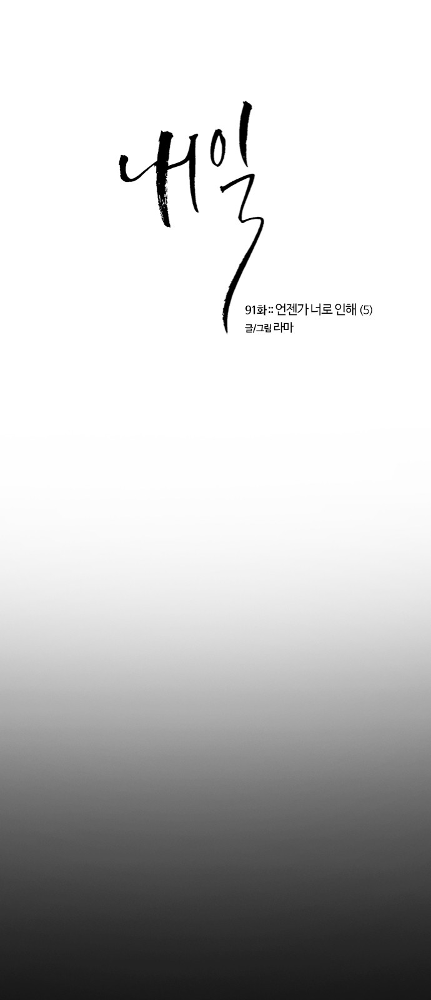

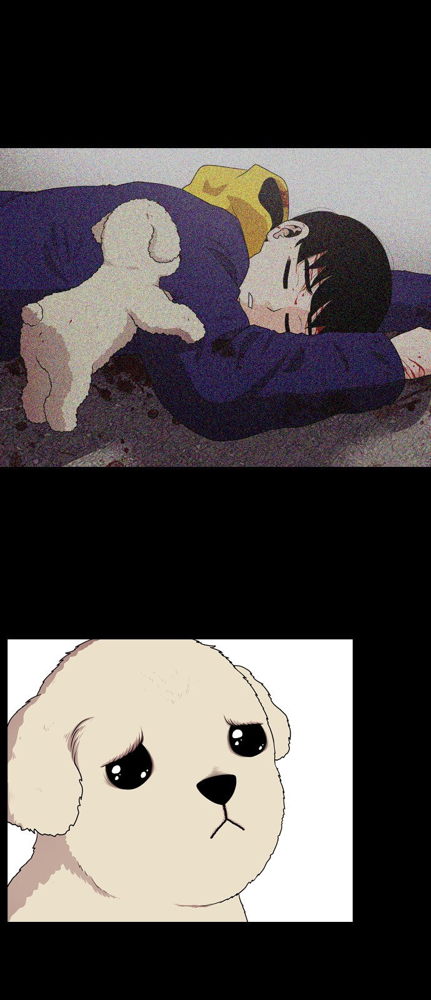

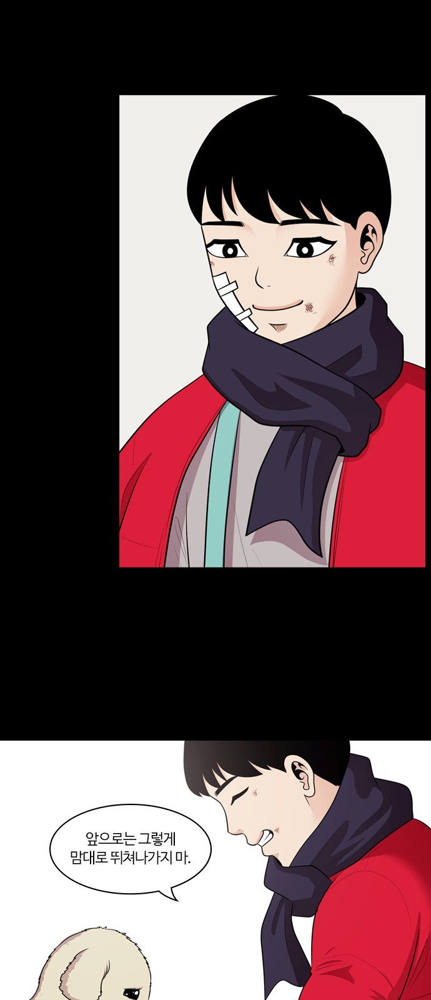

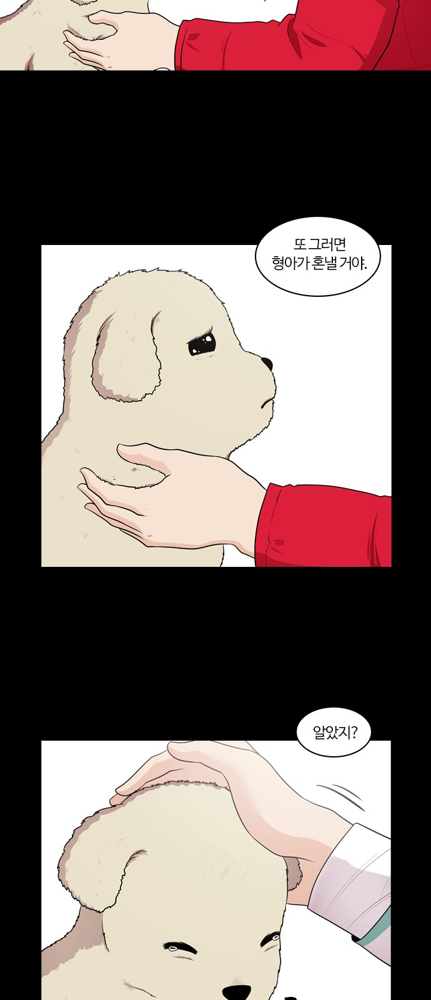

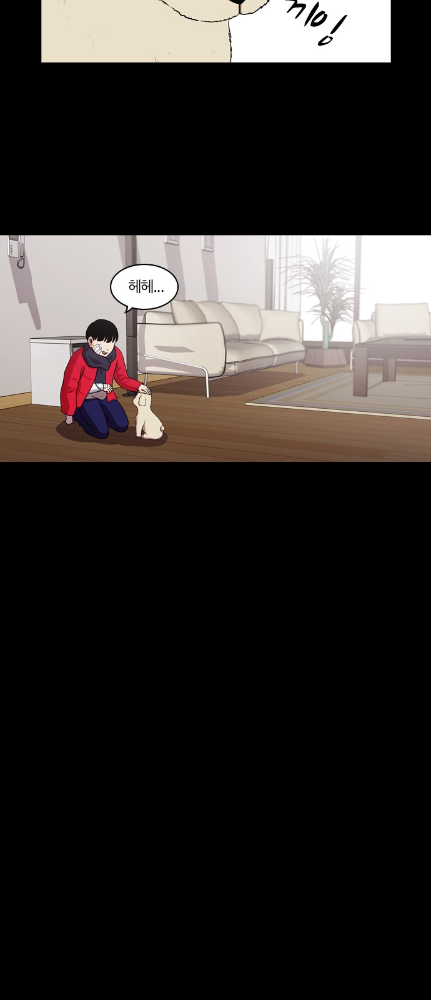

...

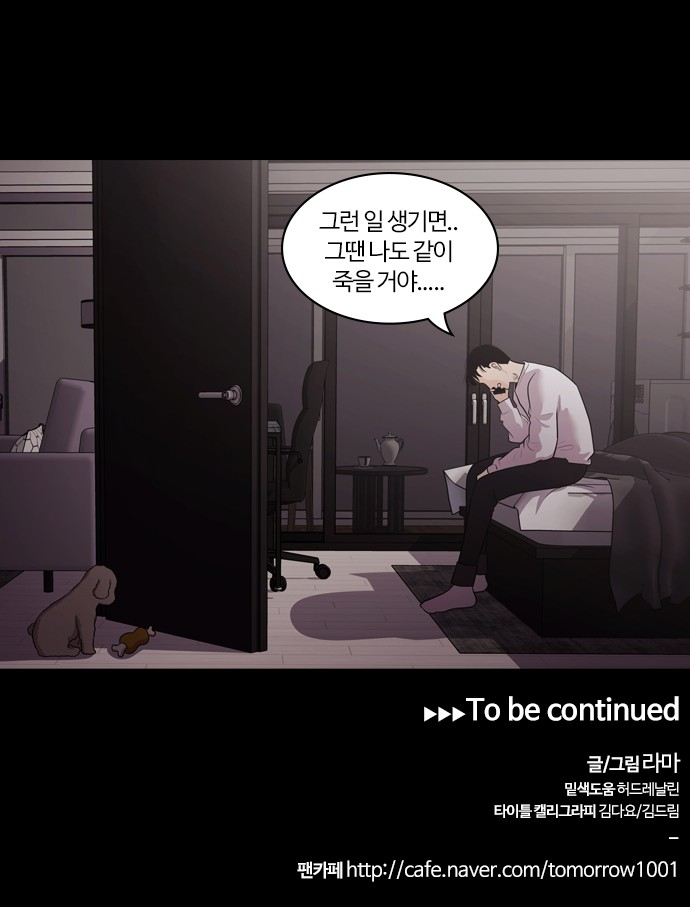

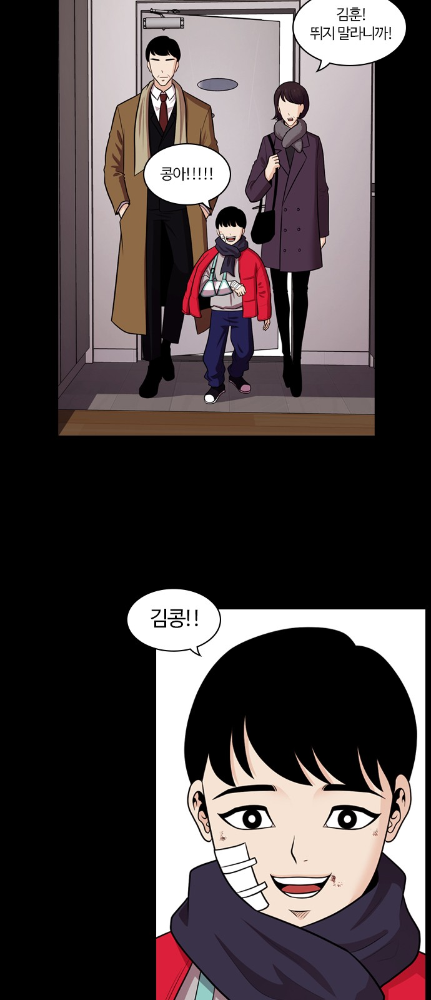

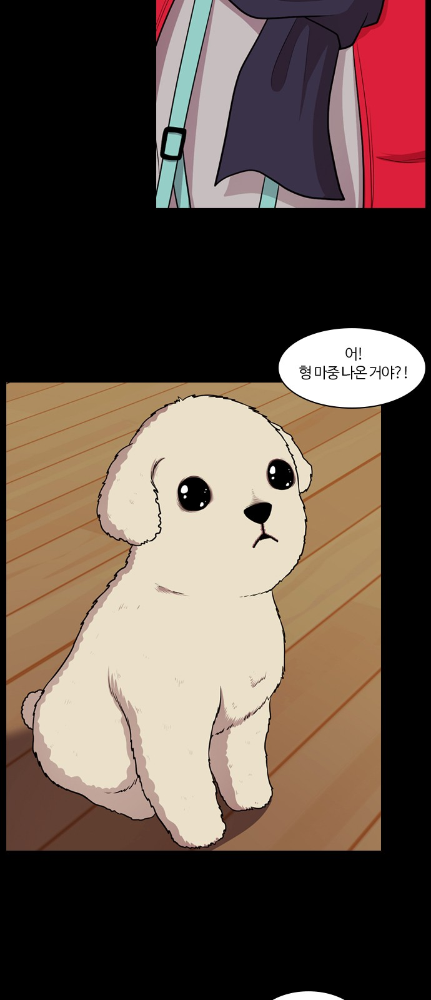

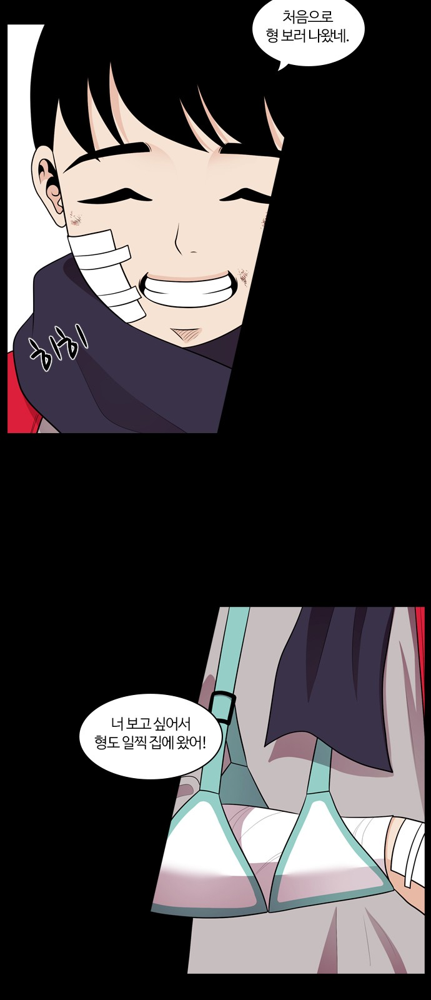

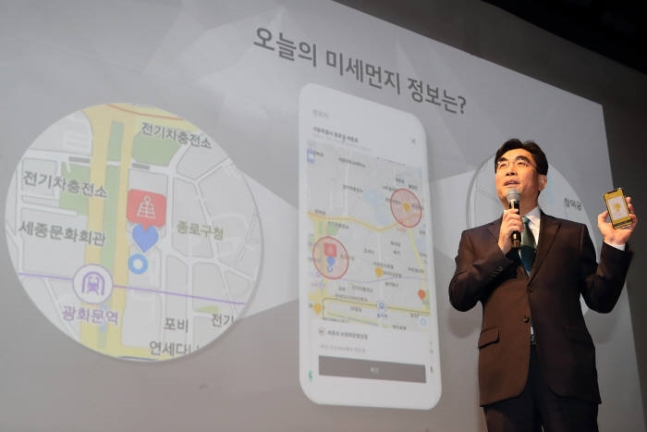

In [23]:
from IPython.display import Image, display
import glob

jpg_list = glob.glob("*.jpg")
for img in jpg_list:
    display(Image(filename= img, width=30, height=20 ))

완료~


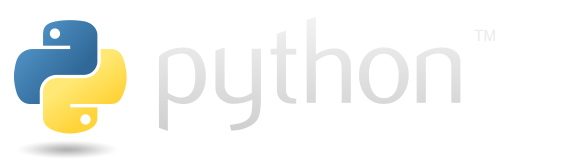

In [24]:
import urllib.request

url="https://www.python.org/static/img/python-logo@2x.png"
outpath = "pythonImage"
filename = "/test.png"

if not os.path.isdir(outpath):
    os.makedirs(outpath)

urllib.request.urlretrieve(url, outpath+filename)    
print("완료~")

display(Image(filename=outpath+filename))

In [46]:
url = "https://www.melon.com/chart/index.htm"



#lst50 > td:nth-child(6) > div > div > div.ellipsis.rank01 > span > a


selector="#frm > div > table > tbody > tr > td:nth-child(6) > div > div > div.ellipsis.rank01 > span > a"

header = { "user-agent" : "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.109 Safari/537.36",
           "referer" : "http://www.naver.com"    }
p = {}
response = requests.get(url, headers = header, params=p)
html_doc = response.text
soup = BeautifulSoup(html_doc, "html.parser")
song_list = soup.select(selector)
mysongs = []
for song in song_list:
    mysongs.append(song.get("title"))
for rank, song in enumerate(song_list):
    print(rank, song.text,"---->", song.get("title")[:-2])

0 멍청이(twit) ----> 멍청이(twit) 
1 이 노래가 클럽에서 나온다면 ----> 이 노래가 클럽에서 나온다면 
2 달라달라 ----> 달라달라 
3 넘쳐흘러 ----> 넘쳐흘러 
4 신청곡 (Feat. SUGA of BTS) ----> 신청곡 (Feat. SUGA of BTS) 
5 벌써 12시 ----> 벌써 12시 
6 초록빛 ----> 초록빛 
7 너도 그냥 날 놓아주면 돼 ----> 너도 그냥 날 놓아주면 돼 
8 신용재 ----> 신용재 
9 띵 (Prod. By 기리보이) ----> 띵 (Prod. By 기리보이) 
10 180도 ----> 180도 
11 너를 만나 ----> 너를 만나 
12 모든 날, 모든 순간 (Every day, Every Moment) ----> 모든 날, 모든 순간 (Every day, Every Moment) 
13 오랜만이야 (Feat. Zion.T) ----> 오랜만이야 (Feat. Zion.T) 
14 SOLO ----> SOLO 
15 그때가 좋았어 ----> 그때가 좋았어 
16 아낙네 ----> 아낙네 
17 내 생에 아름다운 ----> 내 생에 아름다운 
18 MILLIONS ----> MILLIONS 
19 YES or YES ----> YES or YES 
20 Love Shot ----> Love Shot 
21 Home ----> Home 
22 Way Back Home ----> Way Back Home 
23 IDOL ----> IDOL 
24 이별하러 가는 길 ----> 이별하러 가는 길 
25 thank u, next ----> thank u, next 
26 해야 (Sunrise) ----> 해야 (Sunrise) 
27 오롯이 ----> 오롯이 
28 흔한 이별 ----> 흔한 이별 
29 Tempo ----> Tempo 
30 가을 타나 봐 ----> 가을 타나 봐 
31 7 rings ----> 7 rings 
32 삐삐 ----> 삐삐 
33 옥탑방 ----> 옥탑방 


In [81]:
def get_list(title_id, datalist, count):
    url="https://comic.naver.com/webtoon/list.nhn"
    p={"titleId" : title_id }
    h={"Referer" : "http://www.naver.com"}
    html_doc = requests.get(url, headers=h, params=p).text
    soup = BeautifulSoup(html_doc, "html.parser")
    datas = soup.select("#content > table tr > td.title > a")
    #print(datas)
    for data in datas[:count]:
        info = {"title": data.text , "url": data.get("href") }
        #if data.text=='1화':break;
        datalist.append( info )

In [83]:
#웹툰의 title_id를 주고 목록의 리스트 받기 
datalist = []
get_list("708619", datalist, 3)
datalist

[{'title': '9화',
  'url': '/bestChallenge/detail.nhn?titleId=708619&no=15&weekday=story'},
 {'title': '8화',
  'url': '/bestChallenge/detail.nhn?titleId=708619&no=14&weekday=story'},
 {'title': '7화',
  'url': '/bestChallenge/detail.nhn?titleId=708619&no=13&weekday=story'}]

In [73]:
url="https://comic.naver.com/webtoon/list.nhn"
p={"titleId" : "708619" }
h={"Referer" : "http://www.naver.com"}
html_doc = requests.get(url, headers=h, params=p).text
soup = BeautifulSoup(html_doc, "html.parser")
datas = soup.select("#content > table tr > td.title > a")
datas[0]

<a href="/bestChallenge/detail.nhn?titleId=708619&amp;no=15&amp;weekday=story" onclick="nclk_v2(event,'lst.title','708619','15')">9화</a>

In [94]:
for i in range(10):
    print("i=", i)
    if i==2:break
    for j in range(10):
        if j==2:break 
        print("j==============",j)

i= 0
j============== 0
j============== 1
i= 1
j============== 0
j============== 1
i= 2


In [85]:
aa = {'title': '9화',
  'url': '/bestChallenge/detail.nhn?titleId=708619&no=15&weekday=story'}

s = "aaaaaaaaaDDasaaaa"
'DDD' in s


False

In [103]:
def naver_search(keyword, maxpage=5):
    data_dict = {}
    url = "https://search.naver.com/search.naver"
    h = {"Referer" : "https://www.naver.com"}
    
    for page in range(maxpage): #0->1~  1->11~  2->21~ 3->31~ 4->41~
        p = {"query" : keyword, 
             "where":"post",
             "sm":"tab_jum", 
             "start" : page*10 + 1 }
        html_doc = requests.get(url, headers = h, params=p).text
        soup = BeautifulSoup(html_doc, "html.parser")
        selector = "a.sh_blog_title"
        for tag in soup.select(selector):
            if tag["href"] in data_dict:return data_dict
            data_dict[tag["href"]] = tag.text

    return data_dict



In [107]:
#네이버..블로그....5page의 데이터를 가져오기 
#제목, url 
data_dict = naver_search("하노이")
len(data_dict)

50

# Selenium

In [108]:
!pip install selenium

In [112]:
from selenium import webdriver
import time
#브라우저가 실행된다.
browser = webdriver.Chrome("./chromedriver.exe")
#주소창에 요청보내기 
browser.get("http://python.org")
#원하는 데이터를 가져오기 
menus = browser.find_elements_by_css_selector("#top > nav > ul > li")
py = None
for m in menus:
    if m.text == "PyPI":
        py = m 
    print(m.text)
#동작     
py.click()  #특정위치를 클릭 
time.sleep(5)  #5초간 정지 
browser.quit() #브라우져종료 

Python
PSF
Docs
PyPI
Jobs
Community


In [115]:


from selenium import webdriver
import time
#브라우저가 실행된다.
browser = webdriver.Chrome("./chromedriver.exe")
#주소창에 요청보내기 
browser.get("https://github.com/")

browser.find_element_by_css_selector("a.HeaderMenu-link.no-underline.mr-3").click()
time.sleep(2)

browser.find_element_by_css_selector("#login_field").send_keys("wed0406@daum.net")
browser.find_element_by_css_selector("#password").send_keys("12345678")
time.sleep(2)
browser.find_element_by_css_selector("#login > form > div.auth-form-body.mt-3 > input.btn.btn-primary.btn-block").click()



In [117]:

from selenium import webdriver
import time
#브라우저가 실행된다.
browser = webdriver.Chrome("./chromedriver.exe")
#주소창에 요청보내기 
browser.get("https://www.daum.net/")

browser.find_element_by_css_selector("#id.tf_login").send_keys("wed0406@daum.net")
browser.find_element_by_css_selector("#inputPwd").send_keys("12345678")
time.sleep(2)
browser.find_element_by_css_selector("#loginSubmit").click()


NoSuchElementException: Message: no such element: Unable to locate element: {"method":"css selector","selector":"#id.tf_login"}
  (Session info: chrome=72.0.3626.109)
  (Driver info: chromedriver=73.0.3683.20 (8e2b610813e167eee3619ac4ce6e42e3ec622017),platform=Windows NT 10.0.17134 x86_64)


In [120]:
from selenium import webdriver
import time
browser = webdriver.Chrome("./chromedriver.exe")
url="https://www.w3schools.com/colors/colors_rgb.asp"
browser.get(url)
time.sleep(2)
browser.find_element_by_id("r01").clear()
browser.find_element_by_id("r01").send_keys("0")
browser.find_element_by_id("g01").clear()
browser.find_element_by_id("g01").send_keys("255")
browser.find_element_by_id("b01").clear()
browser.find_element_by_id("b01").send_keys("100")
time.sleep(2)
aa = browser.find_element_by_id("hex01").text
print(aa)

html = browser.page_source
soup = BeautifulSoup(html, "html.parser")
color = soup.find("div",{"id": "hex01"})
print(color)
time.sleep(10)
browser.quit()

#00ff64
<div class="w3-margin-top" id="hex01">#00ff64</div>


In [125]:
#조회버튼을 클릭
#모든 직원의 이름을 가져오기 

from selenium import webdriver
import time
browser = webdriver.Chrome("./chromedriver.exe")
url = "http://192.168.2.112:9090/dynamicWebProject/jqAjax/2.html"
browser.get(url)
browser.find_element_by_id("btn1").click()
time.sleep(2)
html = browser.page_source
soup = BeautifulSoup(html, "html.parser")
names = soup.select("#container > table > tbody > tr:not(tr:nth-child(1)) > td:nth-child(2)")
for tag in names:
    print(tag.text)

time.sleep(10)
browser.quit()

aa
윤도4444
하연
일도
윤
도
Diana
Nancy
Daniel
John
Ismael
Jose Manuel
Luis
Den
Alexander
Shelli
Sigal
Guy
Karen
Matthew
Adam
Payam
Shanta
Kevin
Julia
Irene
James
Laura
James
TJ
Jason
Michael
Ki
Hazel
Renske
Stephen
John
Joshua
Trenna
Curtis
Peter
John
Karen
Alberto
Gerald
Eleni
Peter
David
Peter
Christopher
Nanette
Oliver
Janette
Patrick
Allan
Lindsey
Clara
Danielle
Mattea
David
Sundar
Amit
Lisa
Harrison
Tayler
William
Elizabeth
Sundita
Ellen
Alyssa
Jonathon
Jack
Kimberely
Charles
Winston
Jean
Martha
Girard
Nandita
Alexis
Julia
Anthony
Kelly
Jennifer
Timothy
Randall
Sarah
Britney
Samuel
Vance
Alana
Kevin
Donald
Douglas
Jennifer
Michael
Pat
Susan
Hermann
Shelley


In [ ]:
from selenium import webdriver
import time
browser = webdriver.Chrome("./chromedriver.exe")
url = "http://tour.interpark.com/"
browser.get(url)

#1.시간만큼 기다리기 
time.sleep(2)
#2.DOM이 모두 load될때까지 대기,,,,,로드되면 10초 이내라도 바로 진행... 
browser.implicitly_wait(10)
#3.특정 요소가 올라올때까지 대기 
from selenium.webdriver.support.ui import WebDriverWait
from selenium.webdriver.support import expected_conditions as EC
from selenium.webdriver.common.by import By
WebDriverWait(browser, 10).until(
  EC.presence_of_element_located((By.CLASS_NAME, "aaaa"))
)





In [58]:
from selenium import webdriver
import time


db = DBHelper()


browser = webdriver.Chrome("./chromedriver.exe")
url = "http://tour.interpark.com/"
browser.get(url)
browser.find_element_by_id("SearchGNBText").clear()
browser.find_element_by_id("SearchGNBText").send_keys("유럽")
browser.find_element_by_css_selector(".search-btn").click()

browser.implicitly_wait(10)
browser.find_element_by_css_selector(".moreBtn").click()


pages = 2
for page in range(1,pages+1):
    #자바스크립트 구동하기 : browser.execute_script()  
    print("%d 페이지가 시작됨" %page)
    browser.execute_script("searchModule.SetCategoryList(%d, 'R')" %page  )
    html = browser.page_source
    soup = BeautifulSoup(html, "html.parser")
    selector = "div.oTravelBox > ul > li"
    datas = browser.find_elements_by_css_selector(selector)
    tour_list={}

    for li in datas:    
        title = li.find_element_by_css_selector("h5.proTit").text.strip()
        if not title:
            title = li.find_element_by_css_selector("h5").get_attribute("aria-label")
            
        detail_str = li.find_element_by_css_selector("h5").get_attribute("onclick") #'URL', 'URL2'
        detail_url = detail_str.split("'")[1]   #aaaaa'URL1','URL2'  
        tour_list[detail_url] = title

    #상세보기
    for detail_url, title in tour_list.items():
        print("url:", detail_url)
        print("title:", title)

        browser.get(detail_url)
        soup = BeautifulSoup(browser.page_source, "html.parser")
        #가격과 일정을 가져온다. 
        period = soup.select_one("#dBody > div.default-section.goods-info > div.info-section > table > tbody > tr.period > td").text
        price = soup.select_one("#dBody > div:nth-child(3) > div.data-choice > div.total-price > p > strong > em").text
        period = re.findall('.*~.*]',period)[0].strip()
        
        print("기간:" , period)
        print("가격:" , price)
        
        db.insert(title,url,period,price)
        
        print("--------------------------------------------")
        browser.back()

    
browser.quit()






1 페이지가 시작됨
url: http://tour.interpark.com/goods/detail/?BaseGoodsCd=B3011450
title: [맞춤 여행]서유럽 자유 여행 맞춤 견적 문의
기간: 2019.02.21 [목] ~ 2019.02.21 [목]
가격: 10,000
--------------------------------------------
url: http://tour.interpark.com/goods/detail/?BaseGoodsCd=A3012536
title: [감성을 담은 풍경여행♥크루즈2박] 러시아/북유럽/탈린 6국 12일
기간: 2019.04.03 [수] ~ 2019.04.14 [일]
가격: 2,890,000
--------------------------------------------
url: http://tour.interpark.com/goods/detail/?BaseGoodsCd=A3012834
title: (직항) ★BEST인기상품★ 발칸/동유럽 4국9일
기간: 2019.03.03 [일] ~ 2019.03.11 [월]
가격: 1,490,000
--------------------------------------------
url: http://tour.interpark.com/goods/detail/?BaseGoodsCd=A5014164
title: ◆이날만특가◆ 가까운 작은 유럽 청도 2박 3일
기간: 2019.04.15 [월] ~ 2019.04.17 [수]
가격: 179,000
--------------------------------------------
url: http://tour.interpark.com/goods/detail/?BaseGoodsCd=A3013357
title: [주말출도착]서유럽3국8일_리기산+루체른/베르사유
기간: 2019.03.19 [화] ~ 2019.03.26 [화]
가격: 1,390,000
--------------------------------------------
url: ht

In [55]:
import sys
sys.modules["pymysql"]
#sys.modules["DBMgr"]

<module 'pymysql' from 'C:\\Users\\user\\Anaconda3\\envs\\encore\\lib\\site-packages\\pymysql\\__init__.py'>

In [ ]:
#create database pythonDB

In [36]:
import pymysql
conn = pymysql.connect(host="localhost", user="root", password="1234", db="pythonDB",
                      charset="utf8")
cur = conn.cursor()
sql = """
     create table if not exists interparkTour ( 
       id int(10) not null auto_increment,
       title varchar(100) ,
       url varchar(100),
       period varchar(50),
       price varchar(20),
       primary key(id) 
     ) default charset=utf8

"""
cur.execute(sql)
conn.close()

In [56]:
import pymysql
class DBHelper:
    conn = None
    def __init__(self):
        self.db_connect()
    
    def db_connect(self):
        self.conn = pymysql.connect(host="localhost", user="root", password="1234", db="pythonDB",
                      charset="utf8")
        
    def db_disconnect(self):
        if self.conn:
            self.conn.close()
            
    def selectAll(self):
        with self.conn.cursor() as cur:
            sql = "select * from interparkTour"
            cur.execute(sql)
            rows = cur.fetchall()
        return rows
        
    def insert(self,title, url, period, price):
        with self.conn.cursor() as cur:
            sql = """
                  insert into interparkTour(title, url, period, price) 
                  values(%s,%s,%s,%s)
                  """
            cur.execute(sql,(title, url, period, price))
        self.conn.commit()

#현재class가 단독으로 실행할때만 수행한다. 
if __name__ == '__main__':
        db = DBHelper()
        db.insert('title sample','url sample','기간 sample','10000')
        print(db.selectAll())
        db.db_disconnect()

((1, 'title sample', 'url sample', '기간 sample', '10000'), (2, 'title sample', 'url sample', '기간 sample', '10000'), (3, 'title sample', 'url sample', '기간 sample', '10000'), (4, 'title sample2222', 'url sample', '기간 sample', '10000'), (5, 'title sample3', 'url sample', '기간 sample', '10000'), (6, 'title sample', 'url sample', '기간 sample', '10000'), (7, 'title sample', 'url sample', '기간 sample', '10000'), (8, 'title sample', 'url sample', '기간 sample', '10000'))


In [ ]:
headers = {"Referer" : "http://search-tour.interpark.com/PC/", "User-Agent" : "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.109 Safari/537.36"}
params = {"word" : "유럽", "categorycode1" : "R", "offset" : 1, "pageSize" : 20, "filterFlag" : "false"}

response = requests.post("http://search-tour.interpark.com/Payco/Search/GetPaycoResultForCategory", 
              headers = headers, params = params) 

#response.text
jsonObj = response.json()
datalist = jsonObj["datalist"]
for row in datalist:
    print("상품명:", row["goodsname"])
    print("출발일:", row["startdate"])
    print("도착일:", row["enddate"])
    print("상세보기:", row["goodsurl"])
    print("가격:", row["price"])
    print("----------------------------------")

In [ ]:
import requests, json, locale

def getObject(source, keySet) :
    obj = source
    for key in keySet:
        obj = obj.get(key)
    return obj

def getAttrs(rows, attrSet) :
    tuples = []
    for row in rows:
        tuple =  {}
        for attr in attrSet :
            tuple.update({attr:row.get(attr)})
        tuples.append(tuple)     
    return tuples

headers = {"Referer" : "http://search-tour.interpark.com/PC/", "User-Agent" : "Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/72.0.3626.109 Safari/537.36"}
params = {"word" : "유럽", "categorycode1" : "R", "offset" : 1, "pageSize" : 1000000, "filterFlag" : "false"}
with requests.post("http://search-tour.interpark.com/Payco/Search/GetPaycoResultForCategory", headers = headers, params = params) as response :
    datalist = getObject(json.loads(response.text), ["datalist"])
    locale.setlocale(locale.LC_ALL, '') 
    for idx, data in enumerate(datalist) :
        print("---------- {}. {} ----------".format(idx+1, data["goodsname"]))
        print("airline: {}\nprice: \ {}\ngoodsurl: {}\ntripday: {}\ncontent:{}".format(data["airline"], locale.format('%.3d', float(data["price"]), 1), data["goodsurl"], data["tripday"], data["content1"]))
        print()
        #db.insert(data["goodsname"], data["goodsurl"], data["tripday"], locale.format('%.3d', float(data["price"]), 1))